In [1]:
import numpy as np
import cv2
import os
import yaml
import pickle
from glob import glob
import matplotlib.pyplot as plt

In [2]:
#make matplotlib figures appear inline in the notebook
#rather than in a new window.
%matplotlib inline
# set default size of plots
plt.rcParams['figure.figsize'] = (12.0, 10.0) 
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

#print OpenCV version
print ("OpenCV Version : %s " % cv2.__version__)

OpenCV Version : 3.3.1 


In [3]:
# the notebook will reload external python modules;
%load_ext autoreload
%autoreload 2

In [4]:
#source video
video_capture = cv2.VideoCapture('../data/DJI00884.MP4')

In [5]:
#chessboard pattern
pattern_size = (6, 9) #number of points
pattern_points = np.zeros((np.prod(pattern_size), 3), np.float32)
pattern_points[:, :2] = np.indices(pattern_size).T.reshape(-1, 2)

In [6]:
#initializing
frame_step = 10 #read at each 'frame_step' frames
obj_points = []
img_points = []
h, w = 0, 0
i = -1
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_COUNT, 30, 0.001)
retval = True

In [7]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*7,3), np.float32)
objp[:,:2] = np.mgrid[0:7,0:6].T.reshape(-1,2)

Searching for chessboard in frame 0...
ok


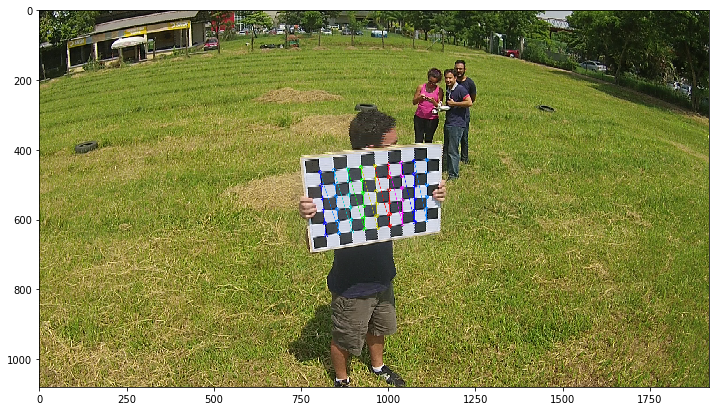

Searching for chessboard in frame 10...
ok


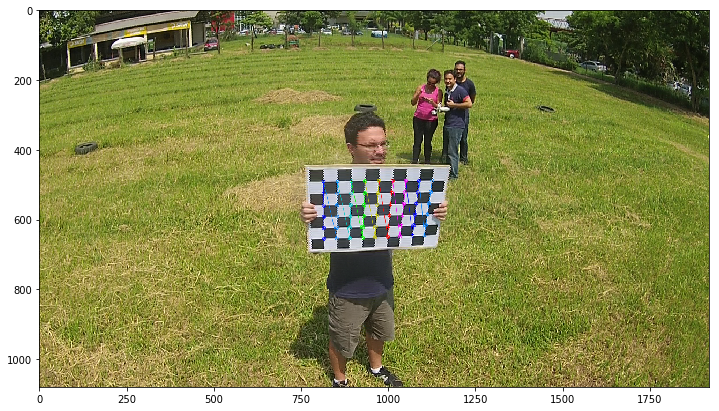

Searching for chessboard in frame 20...
ok


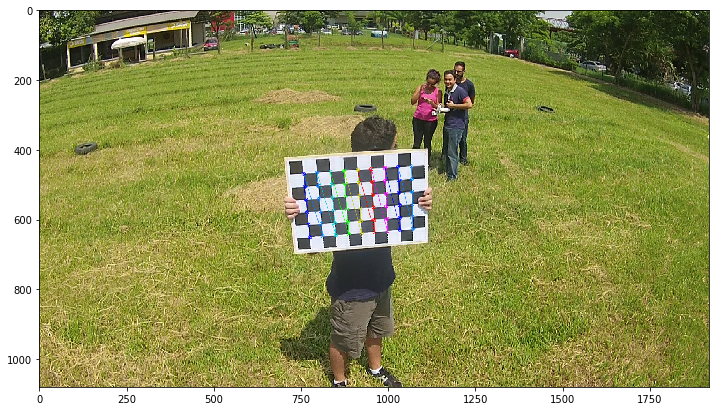

Searching for chessboard in frame 30...
ok


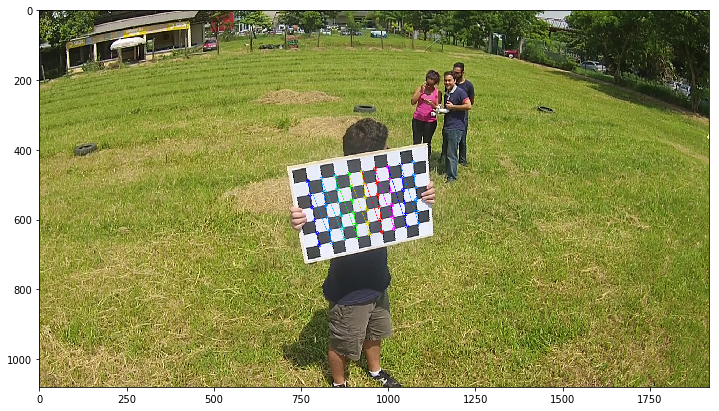

Searching for chessboard in frame 40...
ok


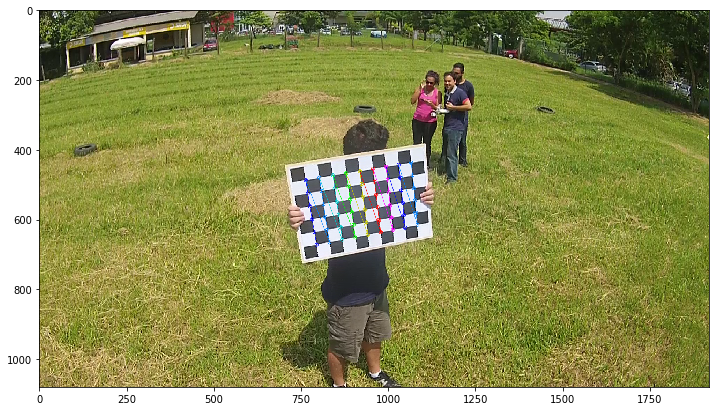

Searching for chessboard in frame 50...
ok


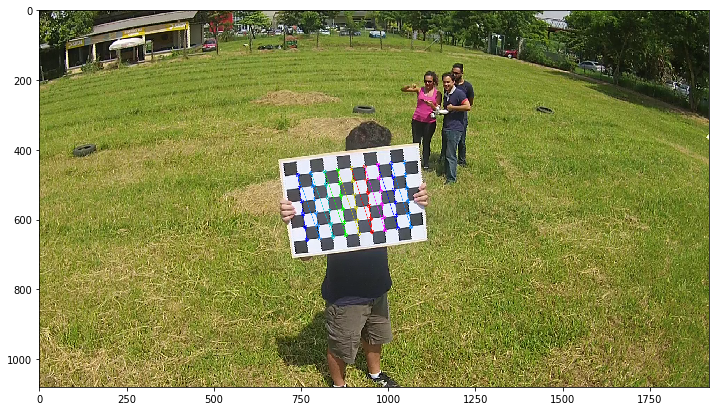

Searching for chessboard in frame 60...
ok


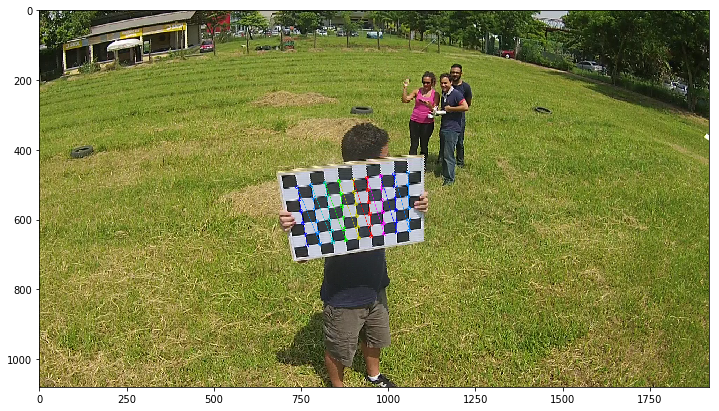

Searching for chessboard in frame 70...
ok


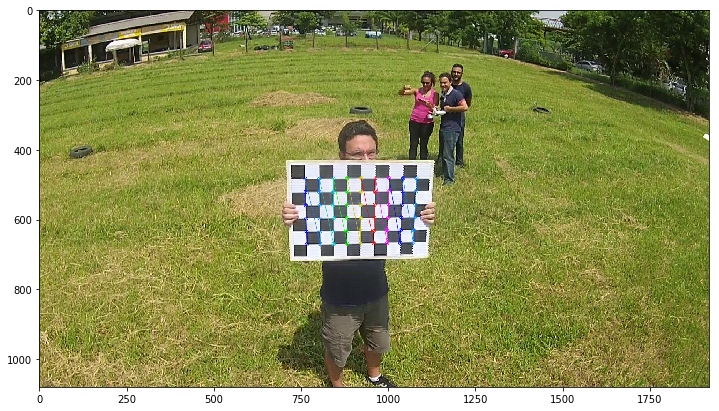

Searching for chessboard in frame 80...
not found
Searching for chessboard in frame 90...
not found
Searching for chessboard in frame 100...
not found
Searching for chessboard in frame 110...
ok


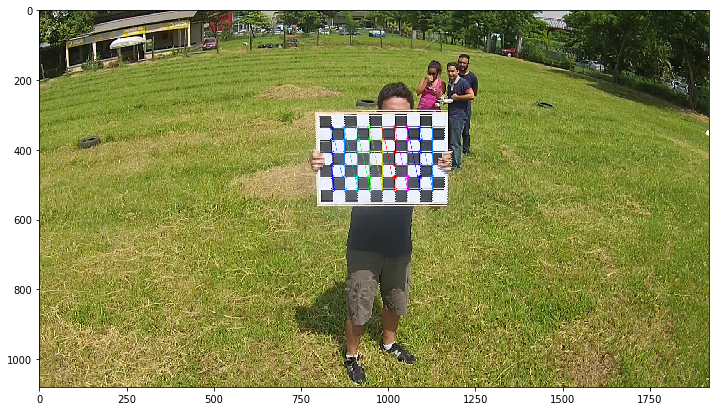

Searching for chessboard in frame 120...
ok


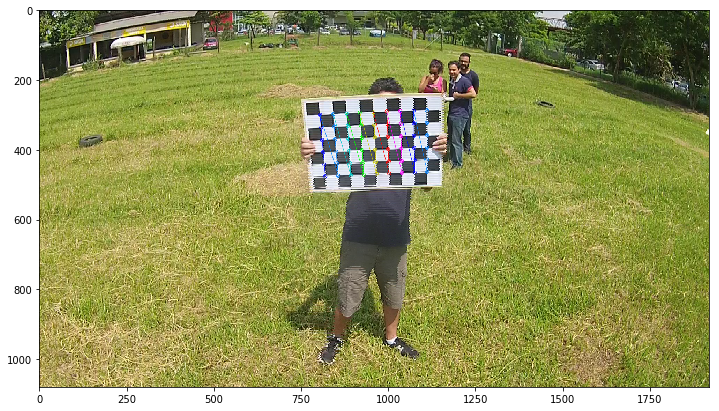

Searching for chessboard in frame 130...
not found
Searching for chessboard in frame 140...
not found
Searching for chessboard in frame 150...
not found
Searching for chessboard in frame 160...
not found
Searching for chessboard in frame 170...
not found
Searching for chessboard in frame 180...
not found
Searching for chessboard in frame 190...
not found
Searching for chessboard in frame 200...
not found
Searching for chessboard in frame 210...
not found
Searching for chessboard in frame 220...
not found
Searching for chessboard in frame 230...
not found
video capture failed!


In [8]:
while retval:
    i+=1
    
    #extracting frame
    retval, img = video_capture.read()
    if not retval:
        print('video capture failed!')
        break
    
    #read at each frame_step    
    if i % frame_step != 0:
        continue
        
    print('Searching for chessboard in frame ' + str(i) + '...')
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
    h, w = img.shape[:2]
    
    #Find chessboard corners
    found, corners = cv2.findChessboardCorners(gray, pattern_size, cv2.CALIB_CB_FILTER_QUADS)
    
    # If found, add object points, image points (after refining them)
    if found:        
        corners2 = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
    
    #If not found, go to next frame
    if not found:
        print('not found')
        continue
    
    img_points.append(corners2)
    obj_points.append(pattern_points)
    
    print('ok')
    
    # Draw and display the corners
    img = cv2.drawChessboardCorners(cv2.cvtColor(img,cv2.COLOR_BGR2RGB), pattern_size, corners2,found)
    plt.imshow(img)
    plt.show()        

## Calibration

In [9]:
print('\nPerforming calibration...')
rms, camera_matrix, dist_coefs, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, (w, h), None, None)
camera_matrix


Performing calibration...


array([[1.20384507e+03, 0.00000000e+00, 9.71852487e+02],
       [0.00000000e+00, 1.19921659e+03, 5.49997252e+02],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

## Undistortion

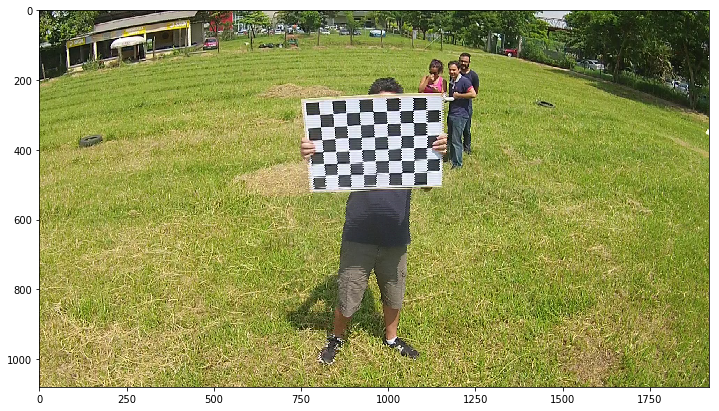

In [10]:
# http://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_calib3d/py_calibration/py_calibration.html
#choosing a frame at random
img = cv2.imread('../data/frames_DJI00884/frame120.jpeg')
h,  w = img.shape[:2]
#efine the camera matrix based on a free scaling parameter using cv2.getOptimalNewCameraMatrix()
new_camera_matrix, roi=cv2.getOptimalNewCameraMatrix(camera_matrix,dist_coefs,(w,h),1,(w,h))
#display image
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.show() 

* Using cv2.undistort()

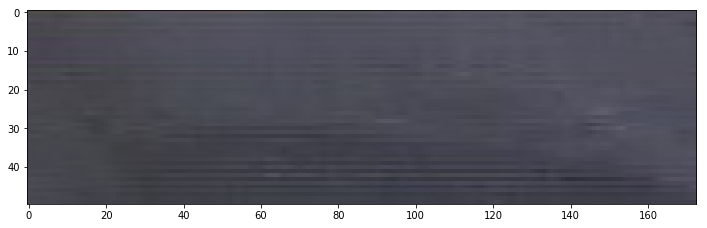

In [11]:
# undistort
dst = cv2.undistort(img, camera_matrix, dist_coefs, None, new_camera_matrix)

# crop the image
x,y,w,h = roi
dst = dst[y:y+h, x:x+w, :]
#display image
plt.imshow(cv2.cvtColor(dst,cv2.COLOR_BGR2RGB))
plt.show() 

uh-oh! something seems wrong here!

* Using remapping

In [12]:
# undistort
mapx,mapy = cv2.initUndistortRectifyMap(camera_matrix,dist_coefs,None,new_camera_matrix,(w,h),5)
dst = cv2.remap(img,mapx,mapy,cv2.INTER_LINEAR)

# crop the image
x,y,w,h = roi
#dst = dst[y:y+h, x:x+w]
#display image
#dst